In [16]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb

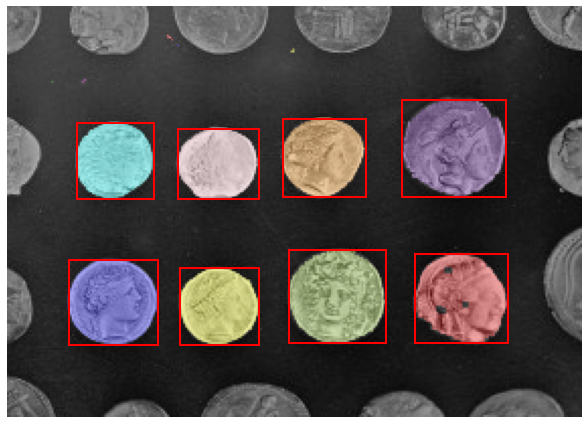

In [72]:

image = data.coins()[50:-50, 50:-50]

# apply threshold
thresh = threshold_otsu(image)
bw = closing(image > thresh, square(3))

# remove artifacts connected to image border
cleared = clear_border(bw)

# label image regions
label_image = label(cleared)
# to make the background transparent, pass the value of `bg_label`,
# and leave `bg_color` as `None` and `kind` as `overlay`
image_label_overlay = label2rgb(label_image, image=image, bg_label=0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)

for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 100:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

ax.set_axis_off()
plt.tight_layout()
plt.show()

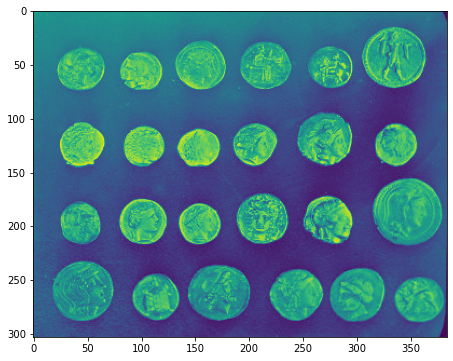

In [73]:
fig, ax = plt.subplots(figsize = (10,6))
ax.imshow(data.coins())

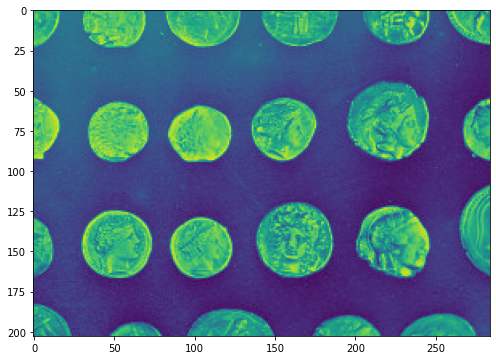

In [74]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image)

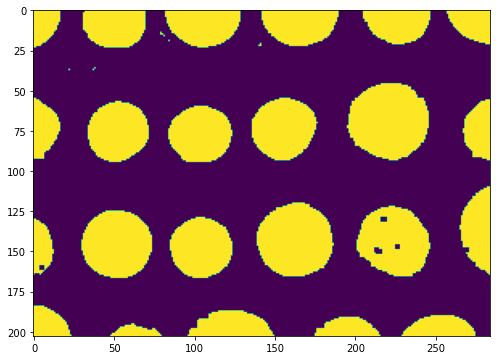

In [75]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(bw)

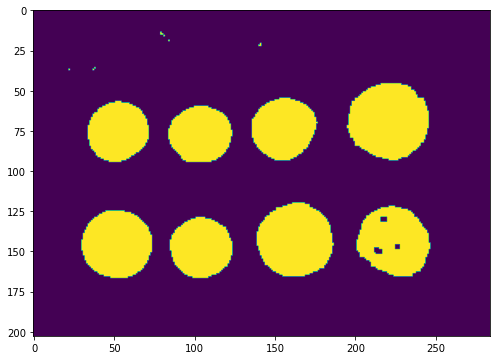

In [76]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(cleared)

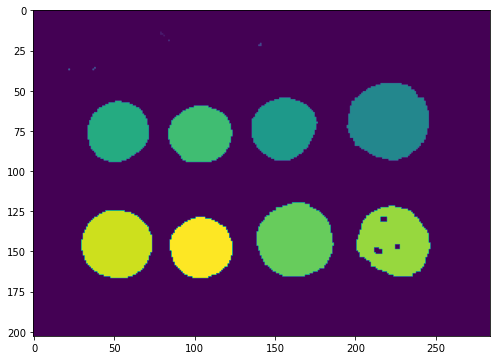

In [24]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(label_image)

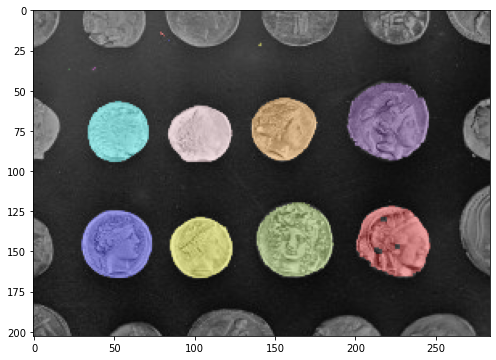

In [25]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)

In [28]:
print(data.coins())

[[ 47 123 133 ...  14   3  12]
 [ 93 144 145 ...  12   7   7]
 [126 147 143 ...   2  13   3]
 ...
 [ 81  79  74 ...   6   4   7]
 [ 88  82  74 ...   5   7   8]
 [ 91  79  68 ...   4  10   7]]


In [29]:
type(data.coins())

numpy.ndarray

In [79]:
from matplotlib import image
from matplotlib import pyplot

In [80]:
image = image.imread("IMG_1452.jpg")
cropped_img = image[0:-100, 350:-100]

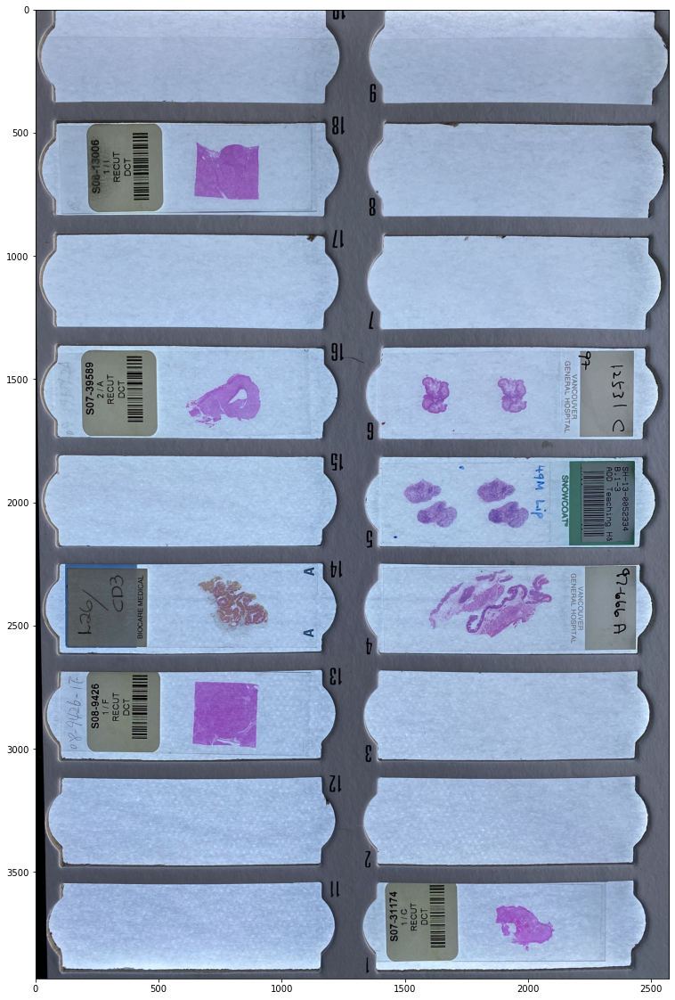

In [81]:
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(cropped_img)

In [94]:
# apply threshold
from skimage.color import rgb2gray
image = rgb2gray(cropped_img) 
thresh = threshold_otsu(image)
bw = closing(image > thresh, square(3))

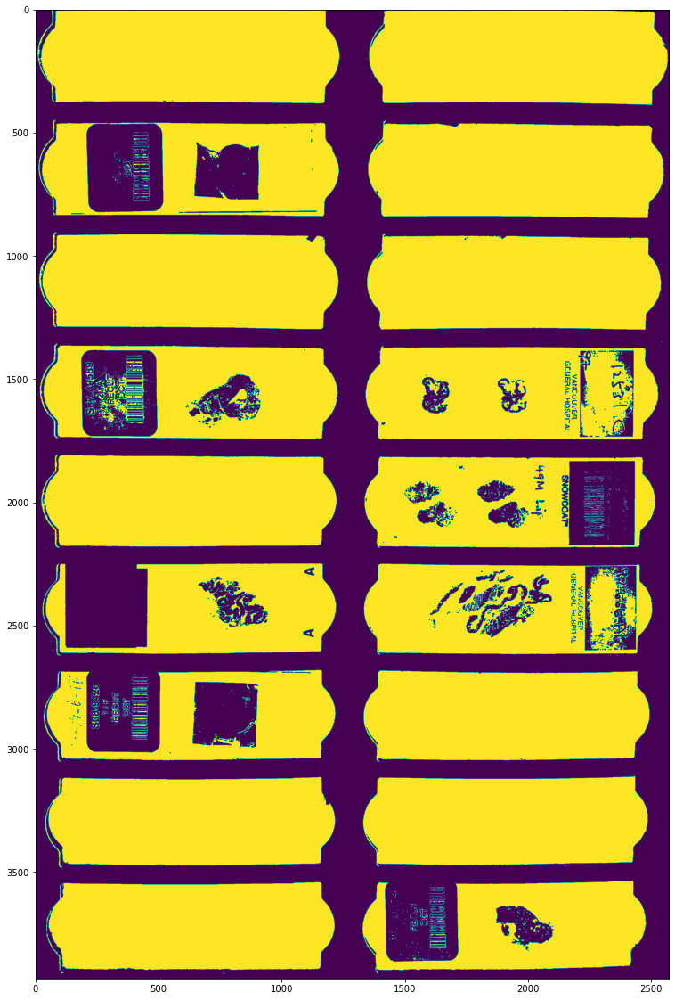

In [95]:
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(bw)

In [84]:
# cleared = clear_border(bw)
# fig, ax = plt.subplots(figsize=(20,20))
# ax.imshow(cleared)

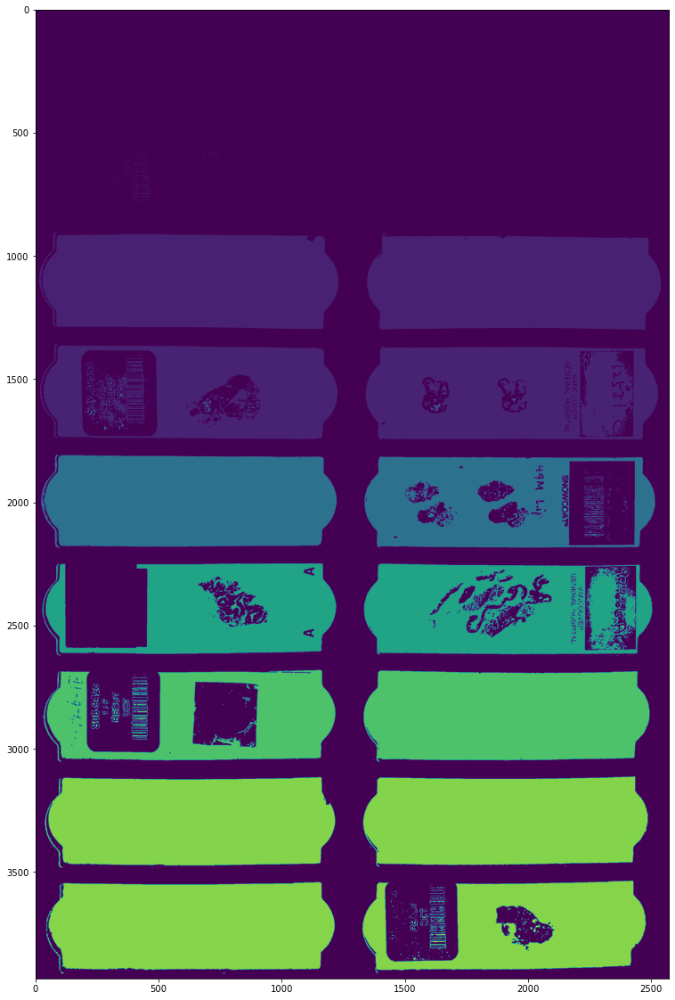

In [85]:
# label image regions
label_image = label(bw)
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(label_image)

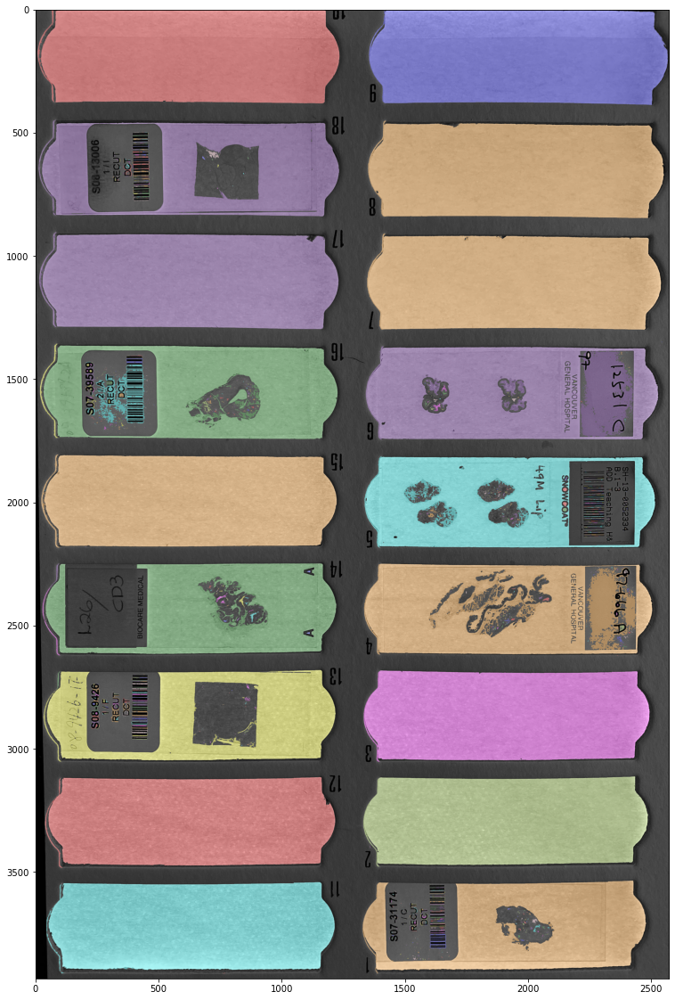

In [88]:
image_label_overlay = label2rgb(label_image, image=image, bg_label=0)
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(image_label_overlay)

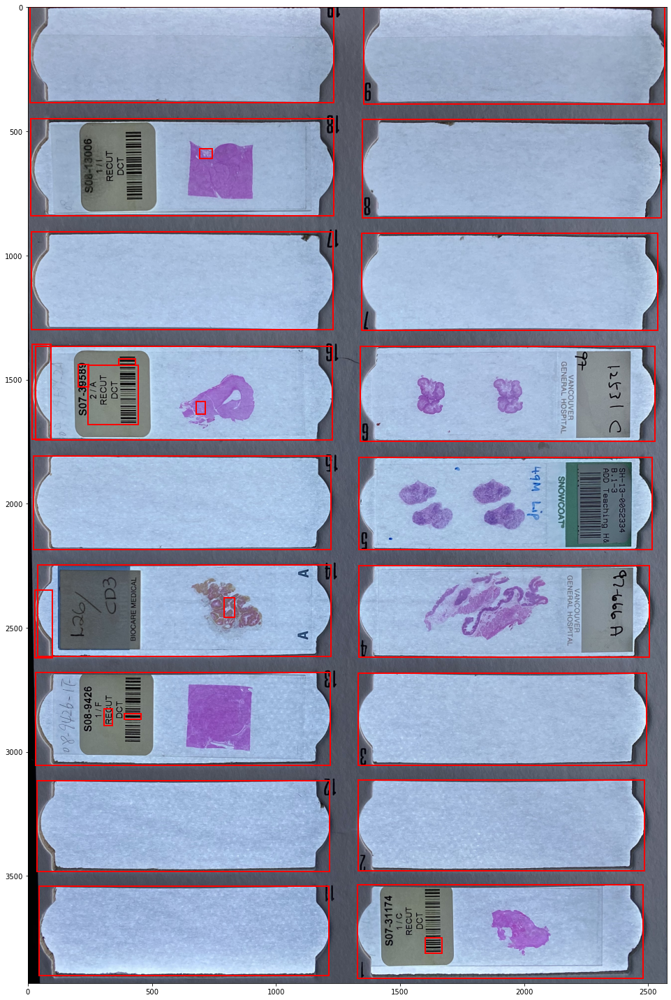

In [112]:
fig, ax = plt.subplots(figsize=(20 , 20))
ax.imshow(cropped_img)

for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 500:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

# ax.set_axis_off()
plt.tight_layout()
plt.show()

0 383 8 1234


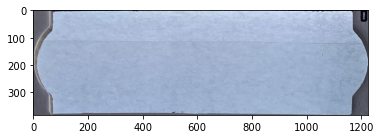

0 390 1353 2567


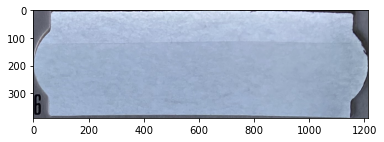

450 841 12 1232


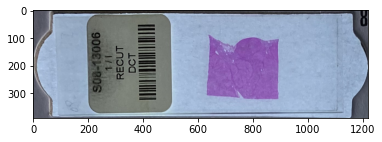

453 848 1349 2551


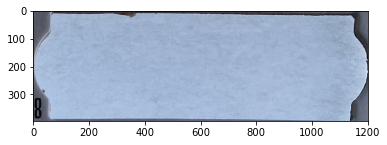

905 1299 14 1230


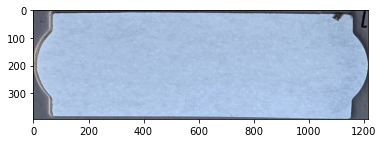

910 1301 1345 2539


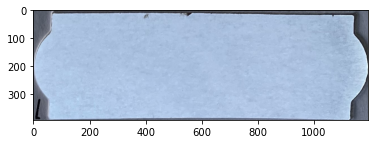

1365 1744 32 1226


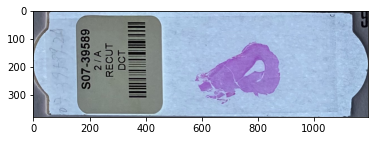

1366 1748 1339 2528


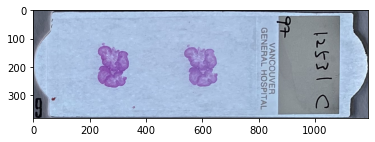

1807 2185 23 1222


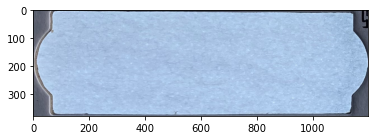

1814 2185 1335 2515


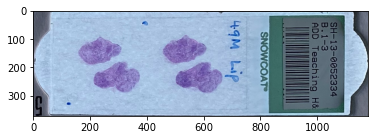

2248 2616 41 1221


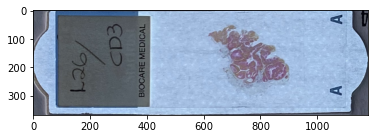

2250 2618 1333 2503


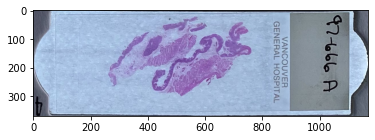

2681 3053 32 1218


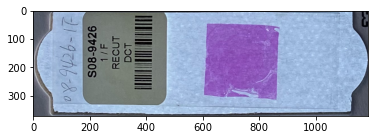

2683 3053 1332 2493


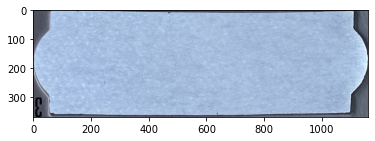

3112 3478 1330 2486


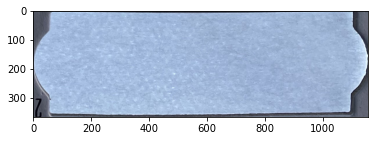

3115 3483 38 1216


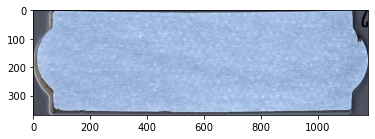

3535 3912 1327 2478


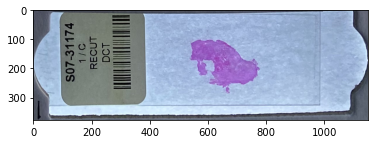

3541 3902 44 1214


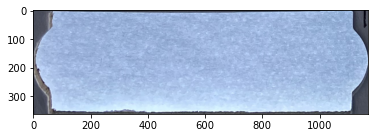

In [114]:
for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 75000:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        print(minr, maxr, minc, maxc)
        plt.figure()
        plt.imshow(cropped_img[minr:maxr,minc:maxc])
        plt.show()